<a href="https://colab.research.google.com/github/Vbalimidi/Dog-breed-predictor/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶End to end Multi-class Dog breed Classification

This notebooks builds an end-to-end muilti-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of the dog.
When I an sitting at a cafe and I take the photo of the dog, I want to know what breed of dog it is.

## 2. Data
The data we are using is from Kaggle's dog breed identification competion.

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features
Some info about the data:
* We are dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10000+ images in the training set. (have labels)
* There are around 10000+ images in the test set. (unlabeled)

## Get our workspace ready

* Import TensorFlow
* Import TensorFlow Hub
* Make sure we're using a GPU

In [1]:
!pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 74.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 64.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 103.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 61.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.7 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.0
    Uninstalling wrapt-1.17.0:
      Successfully uninstalled wrapt-1.17.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtype

In [2]:
# Import necassary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSSS!!!)") if tf.config.list_physical_devices("GPU") else "not available"

TF version: 2.15.0
TF Hub version: 0.16.1
GPU available (YESSSSS!!!)


## Getting our data ready (turning it into tensors)

With all machine learning models, our data has to be in numerical format. Turning our images into tensors (numerical representations)

Let's stary by accesing our data and checking out hte labels

In [3]:
# Check the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog-Vision/labels.csv")
print(labels_csv.describe())#
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

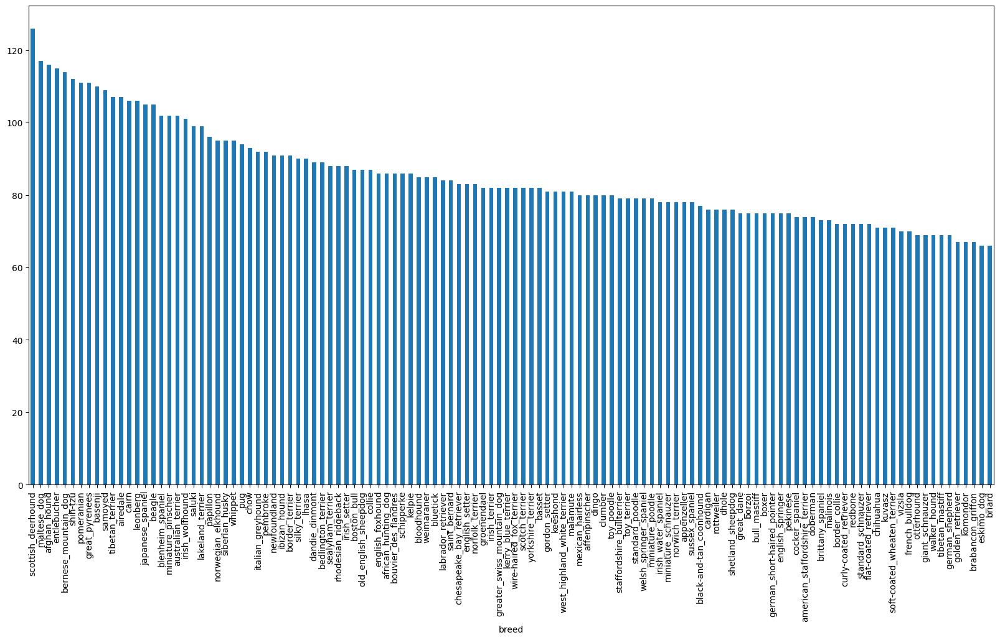

In [4]:
# How many images are there of each brees?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [5]:
labels_csv["breed"].value_counts().median()

82.0

In [6]:
#!unzip drive/MyDrive/Dog-Vision/train.zip -d drive/MyDrive/Dog-Vision

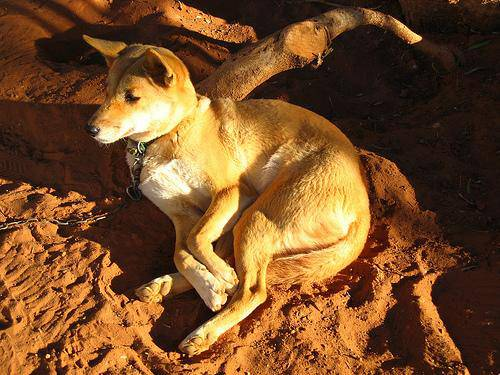

In [7]:
# Let's view an image
from IPython.display import Image

Image("drive/MyDrive/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

In [8]:
# Create path names from images
filenames = ["drive/MyDrive/Dog-Vision/train/"+ fname +".jpg" for fname in labels_csv["id"]]

filenames[:10]

['drive/MyDrive/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
# Check whether number of filenames matches the number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog-Vision/train")) == len(filenames):
  print("correct")
else:
  print("wrong")

correct


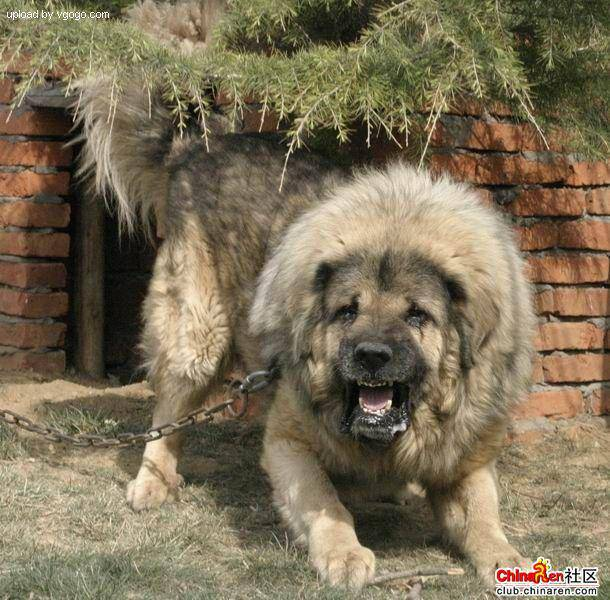

In [10]:
Image(filenames[9000])


# Getting images and their labels

Let's get a list of all of our image file pathnames

In [11]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)

In [12]:
len(labels)

10222

In [13]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Matched")
else:
  print("Not matched")

Matched


In [14]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [15]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

### Creating our validation set

In [17]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with 1000 images and increase as needed

In [18]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10000, step:100}

In [19]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

Preprocessing images (turning images into Tensors)

To preprocess our images into tensors we're going to write a function which does a few things:

1. Take an images filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn `image` (a jpg) into Tensors
4. Resize the `image` to be shape of (224,224)
5. Return the modified `image`

In [20]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [21]:
# Turn image into tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [22]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image and turns the image into Tensors
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn jpeg image into numerical tensor with 3 colour chanels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

In [23]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image,label

Now we've got a way to turn our data into tuples of tensors in the form: (image,label), let's make a function to turn all of our data into batches.

In [24]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image X and label y pairs.
  Shuffles the data if it's training data but doesn'r shuffle if its validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset we probably don't have labels
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn file paths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling
    data = data.shuffle(buffer_size=len(X))

    data = data.map(get_image_label)

    #Turn traing data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [25]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [26]:
# Check different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches however these can be a little hard to understand. So lets visualize.

In [27]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batches
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25
  for i in range (25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [28]:
train_images,train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[2.46588975e-01, 3.95608574e-01, 1.01490915e-01],
          [3.12038183e-01, 4.61057812e-01, 1.66940138e-01],
          [2.63996243e-01, 4.13015872e-01, 1.18898183e-01],
          ...,
          [2.60822803e-01, 4.01999295e-01, 1.62050694e-01],
          [2.82532722e-01, 4.27630782e-01, 1.63695127e-01],
          [2.08769917e-01, 3.53867978e-01, 8.32797065e-02]],
 
         [[2.47740909e-01, 3.96760553e-01, 9.47997272e-02],
          [2.84719437e-01, 4.33739066e-01, 1.31778270e-01],
          [2.70383477e-01, 4.19403106e-01, 1.18072547e-01],
          ...,
          [2.86067784e-01, 4.27244276e-01, 1.87713474e-01],
          [2.63634801e-01, 4.05406564e-01, 1.52640313e-01],
          [2.09158599e-01, 3.54256630e-01, 9.15115252e-02]],
 
         [[2.65375853e-01, 4.17082816e-01, 1.09747343e-01],
          [2.76433945e-01, 4.28140908e-01, 1.20805435e-01],
          [2.63302147e-01, 4.12321746e-01, 1.10991195e-01],
          ...,
          [2.66672611e-01, 4.07849103e-01, 1.6831

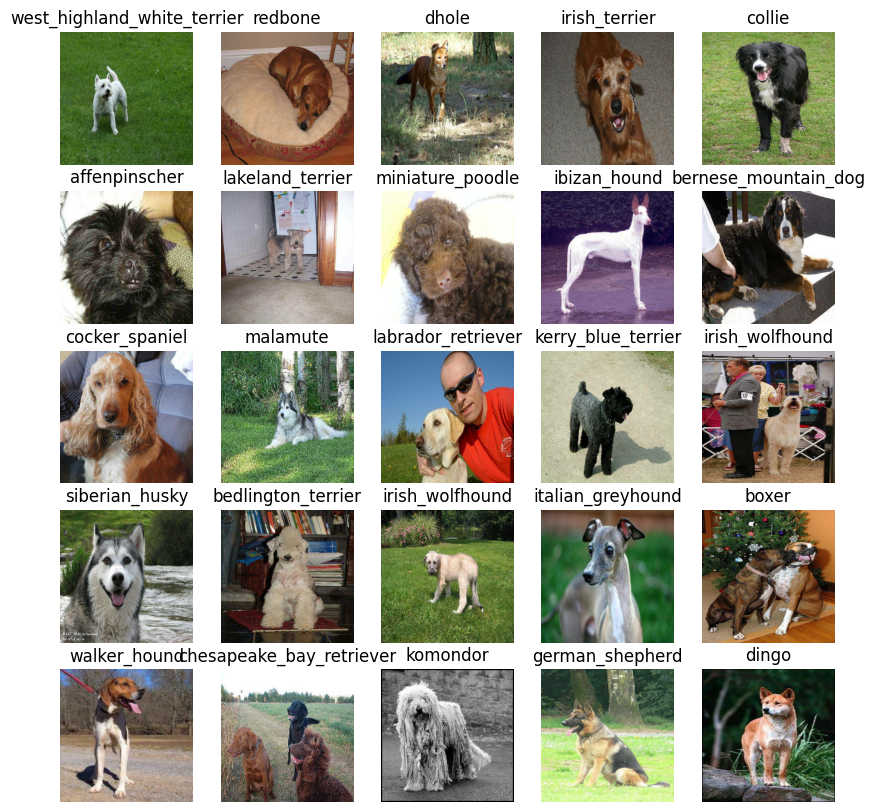

In [29]:
# Visualise the data in a training batch
show_25_images(train_images, train_labels)

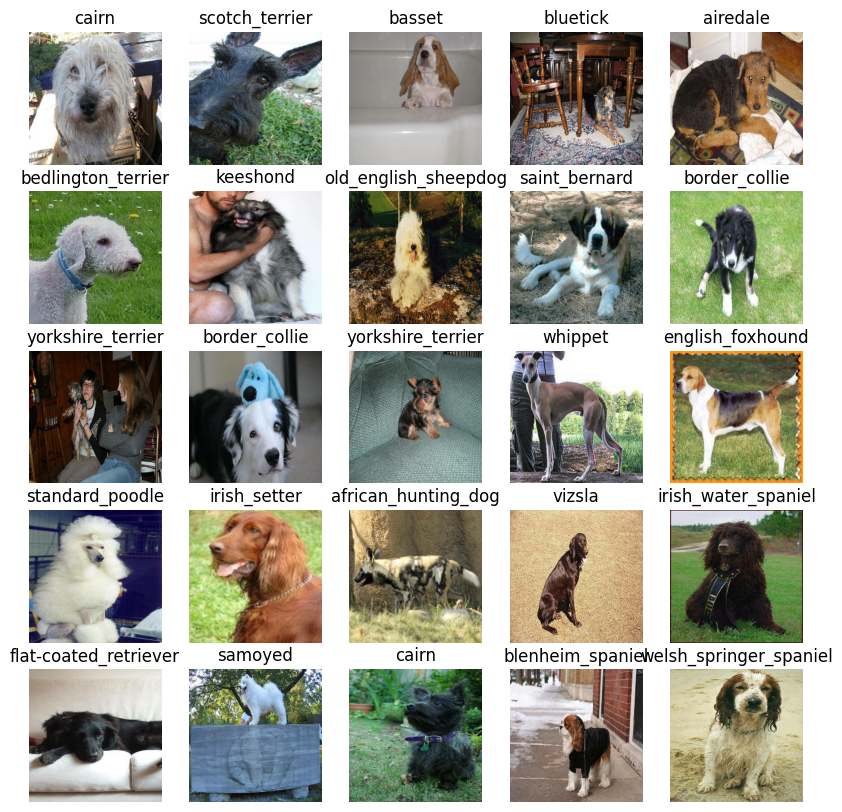

In [30]:
# Visualize validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of model we want to use

In [31]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

#Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL
#MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification"
MODEL_URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

Now we've got our inputs, outputs and model.
Let's put them together into a Keras deeplearning model.

Knowing this lets create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
*  Defines the layers in a Keras model in sequential fasion.
* Compiles the model
* Build the model
* Returns the model

In [32]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [33]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


In [34]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, onr for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

##TensorBoard callback

In [35]:
# Load TensorBoard notebook extenstion
%load_ext tensorboard

In [36]:
import datetime

# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog-Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

In [37]:
# Crete early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [38]:
## Training a model (on subset of data)
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [39]:
print("GPU", "available (YESSSSS!!!)") if tf.config.list_physical_devices("GPU") else "not available"

GPU available (YESSSSS!!!)


In [40]:
# Train the model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create model
  model = create_model()

  # Create new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [41]:
# Fit the model to data
model = train_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Epoch 1/100
25/25 [==============================] - 211s 8s/step - loss: 4.6443 - accuracy: 0.1050 - val_loss: 3.4766 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 6s 222ms/step - loss: 1.5607 - accuracy: 0.6938 - val_loss: 2.1914 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 168ms/step - loss: 0.5171 - accuracy: 0.9425 - val_loss: 1.6990 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 5s 209ms/step - loss: 0.2294 - accuracy: 0.9812 - val_loss: 1.5478 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 4s 172ms/step - loss: 0.1339 - accuracy: 1.0000 - val_loss: 1.4792 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 150ms/step - loss: 0.0914 - accuracy: 1.0000 - val_loss: 1.4351 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 4s

In [42]:
%tensorboard --logdir drive/MyDrive/Dog-vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [43]:
# make predictions on the validation data (not used to train)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 11s 109ms/step


array([[6.18534768e-03, 6.74017763e-04, 1.11052475e-04, ...,
        1.66721118e-04, 2.79938831e-04, 9.52593749e-04],
       [2.21181707e-03, 4.96783759e-04, 2.00630142e-03, ...,
        8.25263342e-05, 7.18644238e-04, 1.19345077e-05],
       [2.82000610e-06, 2.18583500e-05, 8.33890401e-04, ...,
        7.90615391e-04, 7.74319691e-04, 3.21413800e-02],
       ...,
       [1.95764223e-05, 1.80162591e-04, 8.66136452e-06, ...,
        9.98138421e-06, 3.22371023e-04, 4.67511891e-05],
       [3.55809927e-04, 3.79108201e-06, 2.79698615e-05, ...,
        3.02754706e-05, 5.14909771e-05, 5.05024975e-04],
       [2.68181349e-04, 9.19528156e-06, 4.77912195e-04, ...,
        4.14194120e-03, 3.93728405e-04, 8.89749383e-04]], dtype=float32)

In [44]:
# First prediction
index = 0
print (predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted labels: {unique_breeds[np.argmax(predictions[index])]}")


[6.18534768e-03 6.74017763e-04 1.11052475e-04 3.73135008e-05
 1.81103300e-03 2.36889566e-04 1.59180202e-02 2.90621934e-03
 1.12847461e-04 1.20648343e-04 3.03897250e-04 6.19380909e-04
 2.52531026e-04 1.57786984e-04 8.13951556e-05 6.35083066e-04
 5.68001742e-05 7.28568882e-02 3.78712211e-05 2.65742070e-04
 8.65445647e-04 2.48625176e-04 5.95934362e-05 1.54901277e-02
 1.44888154e-05 8.11934297e-05 8.73327404e-02 2.80539331e-04
 5.31164929e-04 2.09372654e-03 3.72735609e-04 4.62859496e-03
 8.35729821e-04 1.12033740e-05 9.12862160e-05 3.61347152e-03
 2.27701203e-05 4.73052089e-04 2.84794041e-05 1.20596518e-03
 8.27990152e-05 3.70892289e-04 9.46818909e-05 3.79555812e-03
 6.33567397e-04 1.35400810e-03 7.90799604e-05 1.90010970e-03
 1.18001585e-03 5.52200654e-04 3.18286766e-04 9.55460651e-04
 1.13742030e-03 3.54010175e-04 1.73600783e-04 1.06119369e-05
 1.65058955e-04 1.14534795e-03 9.32336785e-04 1.20152710e-02
 1.05918421e-04 1.09385583e-03 2.61688745e-03 3.83200677e-04
 3.09744646e-04 7.367414

In [45]:
# Turn prediction probabilities to their respective labels
def get_pred_label(prediction_probailities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probailities)]

# Get predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'chihuahua'

In [46]:
# Create function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of images and labels
  """
  images = []
  labels = []

  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images,labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [47]:
def plot_pred(prediction_probailities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probailities[n], labels[n], images[n]

  # Get teh pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of te title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probablitiy of prediction and truth label
  plt.title("{} {:2.0f}% {}.".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)

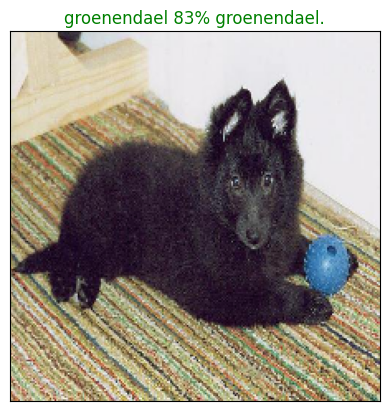

In [48]:
plot_pred(prediction_probailities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Function to visualise our models top 10 predictions

Function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities value
  * Prediction labels
* Plot the top 10 Prediction probabilities value and Prediction probabilities labels, colouring the true label green

In [49]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth lable for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  # Change colour of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


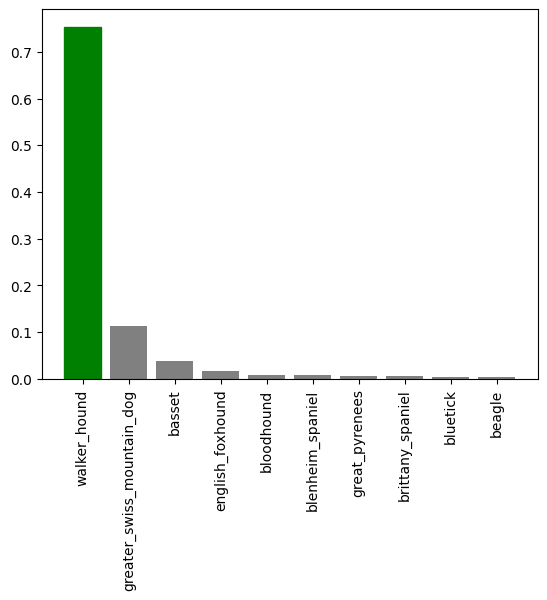

In [50]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=31)

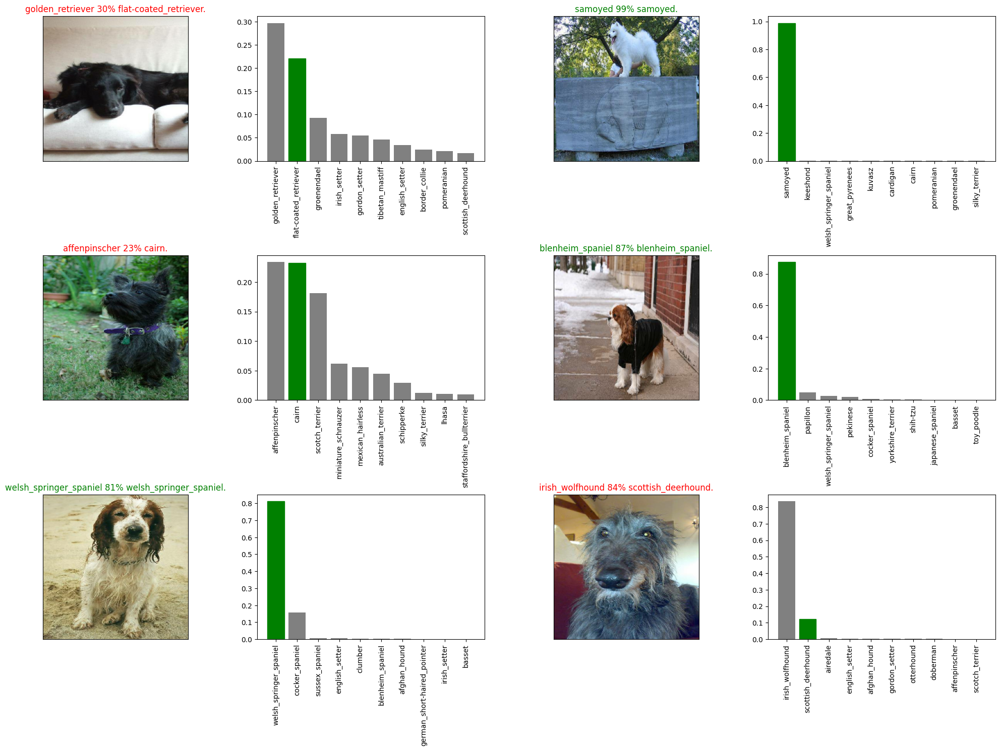

In [51]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probailities=predictions,
          labels=val_labels,
          images=val_images,
          n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Save and reloading a trained model

In [52]:
# Create a function to save a model
def save_model (model, suffix=None):
  """
  SAves a given model in a models directory and appends a suffix (String)
  """
  # Create a model directory path name with current time
  modeldir = os.path.join("drive/MyDrive/Dog-Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"saving model to: {model_path} ...")
  model.save(model_path)

  return model_path

In [53]:
# Function to load a trained model
def load_model(model_path):
  """
  Load a saved model from a specified path
  """
  print(f"Loading saved model from {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [54]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

saving model to: drive/MyDrive/Dog-Vision/models/20241228-20041735416269-1000-images-mobilenetv2-Adam.h5 ...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-Vision/models/20241228-20041735416269-1000-images-mobilenetv2-Adam.h5'

In [55]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog-Vision/models/20241227-23111735341070-1000-images-mobilenetv2-Adam.h5")

Loading saved model from drive/MyDrive/Dog-Vision/models/20241227-23111735341070-1000-images-mobilenetv2-Adam.h5


In [56]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 150ms/step - loss: 1.3286 - accuracy: 0.6550


[1.3285664319992065, 0.6549999713897705]

In [57]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 139ms/step - loss: 1.2942 - accuracy: 0.6650


[1.2941633462905884, 0.6650000214576721]

## Training the model on full data set

In [58]:
len(X), len(y)

(10222, 10222)

In [59]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [60]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [61]:
# Create a model for full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


In [62]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we cant monitor accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


In [66]:
# Fit the model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 49s 135ms/step - loss: 1.2933 - accuracy: 0.6772
Epoch 2/100
320/320 [==============================] - 42s 130ms/step - loss: 0.3779 - accuracy: 0.8888
Epoch 3/100
320/320 [==============================] - 53s 164ms/step - loss: 0.2202 - accuracy: 0.9401
Epoch 4/100
320/320 [==============================] - 49s 153ms/step - loss: 0.1413 - accuracy: 0.9668
Epoch 5/100
320/320 [==============================] - 48s 150ms/step - loss: 0.0962 - accuracy: 0.9811
Epoch 6/100
320/320 [==============================] - 52s 162ms/step - loss: 0.0705 - accuracy: 0.9882
Epoch 7/100
320/320 [==============================] - 52s 163ms/step - loss: 0.0532 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0403 - accuracy: 0.9952
Epoch 9/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0348 - accuracy: 0.9955
Epoch 10/100
320/320 [==============================] - 42s 130m

In [64]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

saving model to: drive/MyDrive/Dog-Vision/models/20241228-20041735416278-full-image-set-mobilenetv2-Adam.h5 ...


'drive/MyDrive/Dog-Vision/models/20241228-20041735416278-full-image-set-mobilenetv2-Adam.h5'

In [65]:
# Load the model
loaded_full_model = load_model("drive/MyDrive/Dog-Vision/models/20241227-23441735343050-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from drive/MyDrive/Dog-Vision/models/20241227-23441735343050-full-image-set-mobilenetv2-Adam.h5


# Making predictions on test data set


In [67]:
# Load test image filenames
test_path = "drive/MyDrive/Dog-Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-Vision/test/c998e2f910ca0aed211cd17e76acdc53.jpg',
 'drive/MyDrive/Dog-Vision/test/c7270880af7d6030950145a1d6636704.jpg',
 'drive/MyDrive/Dog-Vision/test/c8da818ea5e06b5c22a9d5d053896927.jpg',
 'drive/MyDrive/Dog-Vision/test/c272ac0b07e9b0e529f800a40355ed21.jpg',
 'drive/MyDrive/Dog-Vision/test/ce2f35f88dccd00f07c6373bff23308f.jpg',
 'drive/MyDrive/Dog-Vision/test/c5b047b6858c097aa007ae5bc2ecda29.jpg',
 'drive/MyDrive/Dog-Vision/test/ccd36af2aad4ef1e114de0e6d5cfd204.jpg',
 'drive/MyDrive/Dog-Vision/test/c320cd8e85f8b2ff3e371ae6d04953cd.jpg',
 'drive/MyDrive/Dog-Vision/test/cd4b959d5e1f325726b67259ba8e486a.jpg',
 'drive/MyDrive/Dog-Vision/test/ca0d04d27068409b1c6d5592f21f84bd.jpg']

In [68]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


In [69]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)


283/283 [==============================] - 240s 829ms/step


In [71]:
# save predictions (NumPy array) to csv file
np.savetxt("drive/MyDrive/Dog-Vision/preds_array.csv", test_predictions, delimiter=",")

In [72]:
# Load predictions from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog-Vision/preds_array.csv", delimiter=",")

In [73]:
test_predictions.shape

(9054, 120)

In [78]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [79]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [81]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,c998e2f910ca0aed211cd17e76acdc53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,c7270880af7d6030950145a1d6636704,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,c8da818ea5e06b5c22a9d5d053896927,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,c272ac0b07e9b0e529f800a40355ed21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ce2f35f88dccd00f07c6373bff23308f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [83]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,c998e2f910ca0aed211cd17e76acdc53,2.272825e-13,4.695290e-10,3.408434e-10,2.985162e-10,1.724532e-06,6.495393e-10,7.355670e-10,7.044180e-09,9.978744e-01,...,2.561108e-11,1.399398e-13,5.366609e-10,8.322814e-07,6.146765e-08,9.216945e-07,2.863046e-12,7.984096e-09,4.775469e-12,7.114654e-12
1,c7270880af7d6030950145a1d6636704,3.491149e-09,4.831764e-11,1.879249e-10,4.935970e-05,5.706460e-08,4.202943e-10,5.552977e-10,3.788515e-09,6.952034e-06,...,4.267758e-12,8.149983e-11,1.082223e-04,2.347305e-05,3.617377e-04,1.079129e-10,9.156376e-10,1.016424e-10,3.039655e-09,1.234153e-07
2,c8da818ea5e06b5c22a9d5d053896927,1.807655e-07,5.220168e-07,7.245074e-09,4.144230e-06,1.517182e-06,9.376684e-08,1.944203e-05,2.777011e-06,2.350429e-07,...,8.912292e-01,1.138407e-07,3.207743e-08,2.602688e-09,1.349879e-07,3.452888e-07,3.131267e-08,4.776198e-08,2.989520e-07,2.755824e-05
3,c272ac0b07e9b0e529f800a40355ed21,5.463245e-12,1.958796e-08,1.664623e-08,1.158743e-08,3.572363e-11,4.795914e-10,7.934924e-10,2.328644e-09,1.597143e-04,...,6.313137e-13,8.270770e-11,1.791182e-11,3.471035e-04,5.003921e-10,4.656994e-10,1.634552e-11,1.316638e-11,4.530420e-10,1.148219e-10
4,ce2f35f88dccd00f07c6373bff23308f,1.525649e-14,1.169646e-11,5.005010e-13,3.118991e-11,5.454196e-12,1.875894e-10,1.794661e-13,7.858676e-11,5.828259e-13,...,4.552399e-12,2.109923e-12,1.156838e-11,1.950805e-12,5.375957e-07,1.502980e-09,1.287852e-09,3.379861e-02,2.294803e-09,8.063428e-11


In [85]:
# Save our predictions dataframe to CSV
preds_df.to_csv("drive/MyDrive/Dog-Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

# Making prediction on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [94]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog-Vision/myDogPhotos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [95]:
custom_image_paths

['drive/MyDrive/Dog-Vision/myDogPhotos/malteese.jpg']

In [96]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [97]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [98]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['maltese_dog']

In [99]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

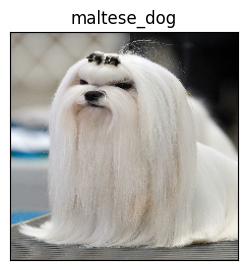

In [100]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
